# OpenCV Learning

## Imports

In [6]:
import cv2 as cv
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import HTML
from base64 import b64encode
import os
import subprocess

## Core Functions

[  0 235 235]
0
image shape is (234, 245, 3)
image size is 171990 pixels


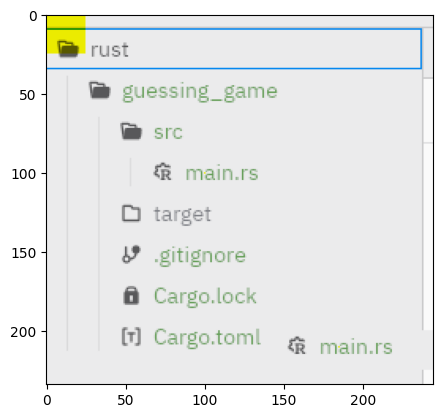

In [3]:
img = cv.imread("data/screenshot.png")
assert img is not None, "file could not be read, check with os.path.exists()"

px = img[100, 100]
print(px)

blue = img[100, 100, 0]
print(blue)

print(f"image shape is {img.shape}")
print(f"image size is {img.size} pixels")

for x in range(25):
    for y in range(25):
        img[x, y, 0] = 0

chunk = img[90:115, 65:160]
img[200:225, 150:245] = chunk

# cv.imshow("window", img)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
# cv.imwrite("data/screenshot.png", img)

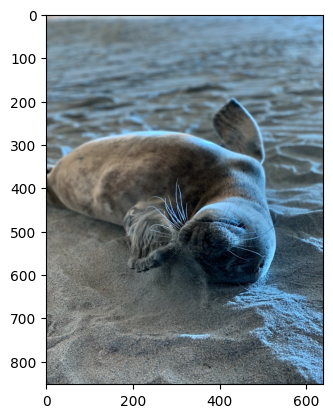

In [4]:
img = cv.imread("data/seal.jpg")

plt.imshow(img)

## Image Processing

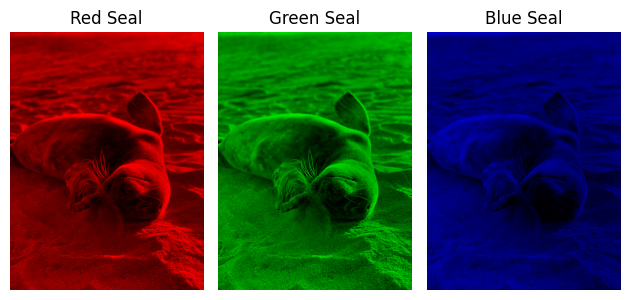

In [5]:
img = cv.imread("data/seal.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
red_seal = img * [1, 0, 0]
green_seal = img * [0, 1, 0]
blue_seal = img * [0, 0, 1]


fig, axs = plt.subplots(1, 3)

axs[0].imshow(red_seal)
axs[0].set_title("Red Seal")
axs[0].axis("off")

axs[1].imshow(green_seal)
axs[1].set_title("Green Seal")
axs[1].axis("off")

axs[2].imshow(blue_seal)
axs[2].set_title("Blue Seal")
axs[2].axis("off")


plt.tight_layout()
plt.show()

['COLORMAP_AUTUMN', 'COLORMAP_BONE', 'COLORMAP_CIVIDIS', 'COLORMAP_COOL', 'COLORMAP_DEEPGREEN', 'COLORMAP_HOT', 'COLORMAP_HSV', 'COLORMAP_INFERNO', 'COLORMAP_JET', 'COLORMAP_MAGMA', 'COLORMAP_OCEAN', 'COLORMAP_PARULA', 'COLORMAP_PINK', 'COLORMAP_PLASMA', 'COLORMAP_RAINBOW', 'COLORMAP_SPRING', 'COLORMAP_SUMMER', 'COLORMAP_TURBO', 'COLORMAP_TWILIGHT', 'COLORMAP_TWILIGHT_SHIFTED', 'COLORMAP_VIRIDIS', 'COLORMAP_WINTER', 'COLOR_BAYER_BG2BGR', 'COLOR_BAYER_BG2BGRA', 'COLOR_BAYER_BG2BGR_EA', 'COLOR_BAYER_BG2BGR_VNG', 'COLOR_BAYER_BG2GRAY', 'COLOR_BAYER_BG2RGB', 'COLOR_BAYER_BG2RGBA', 'COLOR_BAYER_BG2RGB_EA', 'COLOR_BAYER_BG2RGB_VNG', 'COLOR_BAYER_BGGR2BGR', 'COLOR_BAYER_BGGR2BGRA', 'COLOR_BAYER_BGGR2BGR_EA', 'COLOR_BAYER_BGGR2BGR_VNG', 'COLOR_BAYER_BGGR2GRAY', 'COLOR_BAYER_BGGR2RGB', 'COLOR_BAYER_BGGR2RGBA', 'COLOR_BAYER_BGGR2RGB_EA', 'COLOR_BAYER_BGGR2RGB_VNG', 'COLOR_BAYER_GB2BGR', 'COLOR_BAYER_GB2BGRA', 'COLOR_BAYER_GB2BGR_EA', 'COLOR_BAYER_GB2BGR_VNG', 'COLOR_BAYER_GB2GRAY', 'COLOR_BAYER_

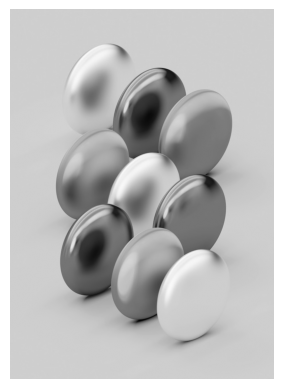

In [6]:
flags = [i for i in dir(cv) if i.startswith("COLOR")]
print(flags)

img = cv.imread("data/eggs.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

print(img.shape)

img = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

print(img.shape)

plt.axis("off")
plt.imshow(img, cmap="gray")

In [7]:
red = np.uint8([[[74, 31, 208]]])
hsv_red = cv.cvtColor(red, cv.COLOR_BGR2HSV)
print(hsv_red)

[[[173 217 208]]]


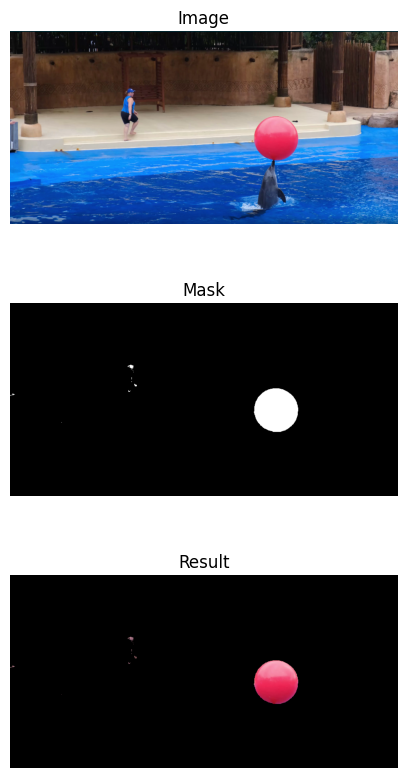

In [8]:
img = cv.imread("data/dolphin_ball.png")
img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

lower_red = np.array([160, 70, 100])
upper_red = np.array([180, 255, 255])
mask = cv.inRange(img, lower_red, upper_red)
res = cv.bitwise_and(img, img, mask=mask)

fig, axs = plt.subplots(3, 1, figsize=(5, 10))

axs[0].set_title("Image")
axs[0].axis("off")
axs[0].imshow(cv.cvtColor(img, cv.COLOR_HSV2RGB))

axs[1].set_title("Mask")
axs[1].axis("off")
axs[1].imshow(mask, cmap="gray")

axs[2].set_title("Result")
axs[2].axis("off")
axs[2].imshow(cv.cvtColor(res, cv.COLOR_HSV2RGB))

plt.tight_layout
plt.show()

In [ ]:
SCALE_FACTOR = 1/3

cap = cv.VideoCapture("data/dolphin_ball.mp4")

fourcc = cv.VideoWriter_fourcc(*'mp4v')
fps = cap.get(cv.CAP_PROP_FPS)
width = int(cap.get(cv.CAP_PROP_FRAME_WIDTH))
small_width = int(width * SCALE_FACTOR)
height = int(cap.get(cv.CAP_PROP_FRAME_HEIGHT))
small_height = int(height * SCALE_FACTOR)
out = cv.VideoWriter("data/processed_side_by_side.mp4",
                     fourcc, fps, (small_width * 3, small_height))

lower_red = np.array([160, 70, 100])
upper_red = np.array([180, 255, 255])


def resize_frame(frame):
    return cv.resize(frame, (int(width * SCALE_FACTOR), int(height * SCALE_FACTOR)))


while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)

    mask = cv.inRange(hsv, lower_red, upper_red)

    res = cv.bitwise_and(frame, frame, mask=mask)

    mask_bgr = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)
    # mask_color = cv.applyColorMap(mask, cv.COLORMAP_JET)

    frame_small = resize_frame(frame)
    mask_small = resize_frame(mask_bgr)
    res_small = resize_frame(res)
    combined = np.hstack((frame_small, mask_small, res_small))

    out.write(combined)

cap.release()
out.release()

input_file = "data/processed_side_by_side.mp4"
output_file = "data/processed_side_by_side_h264.mp4"

command = [
    'ffmpeg',
    '-i', input_file,
    '-c:v', 'libx264',
    '-y',
    output_file
]

result = subprocess.run(command, capture_output=True, text=True, check=False)

if result.returncode == 0:
    print("✅ Video successfully converted for web playback!")
else:
    print("❌ FFmpeg conversion failed.")
    print(result.stderr)

✅ Video successfully converted for web playback!


In [11]:
mp4 = open(output_file, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=1920 controls autoplay loop>
    <source src="{data_url}" type="video/mp4">
</video>
""")